# Object Detection Training Template

## Introductory Notes

This notebook shows how to train an EfficientDet model for detecting controllers using the TensorFlow Object Detection API. The models use our synthetic data for training. The trained models are then exported and can be used for evaluation.

The code in this notebook can be run either locally or on Google Colab. For local execution, the Object Detection API and a few standard modules need to be installed – see the README file in the project main directory for more detailed information. 

If using Colab, the notebook includes installation of all the necessary libraries, including the Object Detection API. 
When running on Colab, one can optionally harness the available TPU. When using the TPU, all the data and model files will have to be moved to Google Cloud Storage before training.

The following files from the source directory are needed:
*   __src/preproc.py__ – functions used to preprocess the data
*   __src/visualize.py__ – tools to visualize the processed images
*   __src/generate_tfrecord.py__ – a script to generate TF .record files from image data and XML annotations

Assumed project structure:
```
main_project_dir/
├─ README.md                               
├─ generate-synthetic-images/              <- scripts to generate synthetic images 
├─ data/                  
│   ├─ test-annotated-images/              <- test images with xml annotations
│   ├─ synthetic-annotated-train-images/   <- synthetic images with xml annotations used for training 
│   ├─ test-google-images/                 <- a handful of images of other cabinets from Google search that we can use for final testing
│   ├─ train-valid-split
│   │    ├─ training/                      <- preprocessed training images with xml annotations
│   │    ├─ validation/                    <- preprocessed validation images with xml annotations
│   │    ├─ train.record                   <- TF .record file containing the training data
│   │    ├─ valid.record                   <- TF .record file containing the validation data
│   │    └─ label_map.pbtxt                <- label map file that maps class IDs to class names
├─ models/                              
│   ├─ pre-trained/                        <- pre-trained models downloaded from TF Object Detection Model Zoo
│   ├─ fine-tuned/                         <- fine-tuned models trained on the data in train-valid-split
├─ notebooks/                              <- notebooks used for training and evaluation
│   ├─ EPRI_ObjectDetection_Training.ipynb
│   └─ EPRI_ObjectDetection_Evaluation.ipynb
└─ src/                                    <- modules used in the notebooks
```

**NOTE**: When executing the code locally, it is assumed we are running from the notebooks folder, not the main project directory.

## TPU and GCS usage

In [1]:
# Use TPU if connected to a TPU runtime.
try:
  import tensorflow as tf
  tpu = tf.distribute.cluster_resolver.TPUClusterResolver()  # TPU detection
  print('Running on TPU ', tpu.cluster_spec().as_dict()['worker'])
  USE_TPU = True
  # set a Google Cloud Storage bucket (change as appropriate)
  GS_ROOT = "gs://s2ds-aug2021-cv/"
except:
  print('Not connected to a TPU runtime: using GPU or CPU instead.')
  USE_TPU = False

Running on TPU  ['10.118.241.194:8470']


## Colab Initialization (skip if running locally)

In [2]:
from pathlib import Path
# main project directory
MAIN_DIR = Path("/content/gdrive/MyDrive/s2ds-aug2021-cv")
# location of TF Object Detection API
TF_DIR = MAIN_DIR/'tf-models'

# where to install additional python modules
INSTALL_DIR = MAIN_DIR/"colab-install"
INSTALL_SITE_DIR = INSTALL_DIR/"lib/python3.7/site-packages"

Mount Google Drive

In [3]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


Init Google Cloud Storage (to use TPU)

In [ ]:
if USE_TPU:
  from google.colab import auth
  auth.authenticate_user()
  !gcloud init

Install TF Object Detection API

In [5]:
import glob

if not TF_DIR.exists():
  !git clone --depth 1 https://github.com/tensorflow/models $TF_DIR

if len(glob.glob(str(INSTALL_SITE_DIR/'object_detection*')))==0:
  %cd {TF_DIR/'research'}
  !protoc object_detection/protos/*.proto --python_out=.
  !cp object_detection/packages/tf2/setup.py .
  !python setup.py build
  !python setup.py install --prefix=$INSTALL_DIR

Reinstall imgaug

In [6]:
if not (INSTALL_SITE_DIR/'imgaug').exists():
  !pip install git+https://github.com/aleju/imgaug.git --prefix=$INSTALL_DIR

Update Python PATH with the previously installed (to Google Drive) packages  and go to the notebooks directory

In [7]:
%cd {MAIN_DIR}
from src.utils import add_pkgs_to_path
add_pkgs_to_path(str(INSTALL_SITE_DIR))
%cd notebooks

/content/gdrive/MyDrive/s2ds-aug2021-cv
/content/gdrive/MyDrive/s2ds-aug2021-cv/notebooks


## General Initialization

Set path to the project directory and add it to Python PATH

In [8]:
from pathlib import Path
import os, sys
NOTEBOOK_DIR = Path(os.getcwd().replace(' ',''))
MAIN_DIR = Path(os.path.abspath("..").replace(' ',''))
sys.path.insert(0, str(MAIN_DIR))

Set path to TF Object Detection API (change as appropriate)

In [9]:
TF_DIR = MAIN_DIR/"tf-models" 

Imports

In [10]:
import numpy as np
import matplotlib.pyplot as plt
import os, shutil, glob
import urllib.request
import tarfile

# TF object detection API utils
from object_detection.utils import label_map_util 
from object_detection.utils import config_util 

# our src/ functions
import src.preproc as src_pre
import src.visualize as src_viz

%matplotlib inline

Project folder structure: set paths to existing directories

In [11]:
DATA_DIR = MAIN_DIR/'data'
# Folder containing unprocessed/unaugmented annotated synthetic data 
# (images + corresponding XML annotation files) used for training
RAW_SYN_DATA_DIR = DATA_DIR/'synthetic-train-annotated-images'
# Unprocessed annotated test data
RAW_TEST_DATA_DIR = DATA_DIR/'test-annotated-images'

# Processed (e.g. resized, augmented) training/validation data 
# ready for the model to use 
TRAIN_VALID_DIR = DATA_DIR/'train-valid-split'

# Models location
MODELS_DIR = MAIN_DIR/'models'
# Pretrained models from TF model zoo
PRE_MODELS_DIR = MODELS_DIR/'pre-trained'
# Our fine-tuned models
FT_MODELS_DIR = MODELS_DIR/'fine-tuned'

## Choose a synthetic data folder to use for training the model

* Each image in the main synthetic dataset we use below contains 5 to 9 Siemens S7-300 and Allen Bradley controllers and 3 to 6 distractor Siemens ET200M controllers pasted onto backgrounds. 
* The scale of the controllers is adjusted to each background. We also introduce additional 10% random variations of size and 5-degree random rotations.

In [15]:
RAW_TRAIN_DATA_DIR = RAW_SYN_DATA_DIR/'bg_adjusted_with_distractors'

## Global parameters

In [16]:
# Target size of training/validation images after preprocessing (should be consistent with the model in use)
IMAGE_SIZE = 1024
# Batch size (reduce if out of GPU memory)
BATCH_SIZE = 32

## Initialize data-related directories and paths

In [17]:
# Directories for preprocessed annotated image data used for training/validation
train_data_dir = TRAIN_VALID_DIR/'training'
valid_data_dir = TRAIN_VALID_DIR/'validation'
if not train_data_dir.exists():
  train_data_dir.mkdir()
if not valid_data_dir.exists():
  valid_data_dir.mkdir()

# Paths to TF .record files containing training and validation data (including annotations)
train_tfrec_path = TRAIN_VALID_DIR/'train.record'
valid_tfrec_path = TRAIN_VALID_DIR/'valid.record'

# Path to the label map file that maps class IDs to class names
label_map_path = TRAIN_VALID_DIR/'label_map.pbtxt'

## Create and save the label map

The label map file maps class IDs to class names. It is needed for the model to initialize. We save it in `TRAIN_VALID_DIR`.

In [18]:
%%writefile $label_map_path
  item {
    id: 1
    name: 'AllenBradley'
  }
  item {
    id: 2
    name: 'Siemens'
  }

Overwriting /content/gdrive/MyDrive/s2ds-aug2021-cv/data/train-valid-split/label_map.pbtxt


In [19]:
label_map_dict = label_map_util.get_label_map_dict(str(label_map_path))
# Number of classes extracted from the label map
num_classes = len(label_map_dict)

## Data preparation and augmentation

In [19]:
# clear train/validation directories if they exist
src_pre.clear_dir(train_data_dir)
src_pre.clear_dir(valid_data_dir)

### Training data, image augmentation

* Augmenting the training images by applying random transformations helps diversify the training set and avoid overfitting. 
* Without augmentation, the model quickly learns how to find controllers in our artificial images and is prone to relying on the unnatural artifacts in the synthesised data. This reduces performance on the test set.

The augmentation strategy we use is RandAugment. For each synthesised image, we apply 2 types of augmentations randomly chosen from the list of ten transformations:
* Rotation
* Shear along X
* Shear along Y
* Gaussian noise
* Motion blur
* Sharpness

Random color adjustments:
* Brightness 
* Hue
* Contrast
* Saturation

RandAugment has only two parameters:
1. Number of augmentations to apply to each image: `rand_aug_num`
2. Magnitude of augmentations: `rand_aug_mag`, same for all


* Before augmentation, resize synthesised images so that the largest dimension is `IMAGE_SIZE` and pad to square shape if necessary
* We repeat the augmentation process `augment_mult` times to generate `augment_mult` times more images
* Annotation files are transformed along with the images
* Place the augmented data with annotations in `train_data_dir`

In [20]:
# Resize, apply augmentation to images and annotations in RAW_TRAIN_DATA_DIR 
# and place the processed data in train_data_dir.
src_pre.copy_augment_data(
    RAW_TRAIN_DATA_DIR, train_data_dir,
    augment_mult = 10, 
    target_max_size = IMAGE_SIZE,
    pad2square = True,
    rand_augment = True,
    rand_aug_mag = 1.4,
    rand_aug_num =  1.,
    )

100%|██████████| 300/300 [09:04<00:00,  1.81s/it]


Produced 3000 images with labels


In our experience, augmentation leads to a ~6% increase in mAP at 0.5 IOU, and ~10% in mAP at 0.75 IOU, while also decreasing the number of false positive detections.

### Validation data

#### What data do we use for validation?

Validation data is used to evaluate model performance on real data during training. Because we have test data only for a single cabinet, we are forced to validate on the test data. With more cabinets, one can validate on images of one cabinet, and then, after training, see how the model generalizes by testing on the independent dataset from another cabinet. We should be aware that by evaluating on our only cabinet and adjusting model parameters to improve evaluation scores, we might be overfitting to this particular cabinet. Nevertheless, in the evaluation notebook, we demonstrate that the model also performs well on a few Google images of another cabinets

#### Shape of images for evaluation

We have noticed that our model performs significantly better on square images without padding. Then we have two options:
1. Stretch images to square shape
2. Split rectangular images into two square crops

While the first option does lead to good performance, stretching at higher aspect ratios might not be a consistent way to make detections. Therefore, we provide a function that splits test images and their annotations into two squares:

In [21]:
# Copy cropped images to the validation data folder
src_pre.make_split_images_and_labels(RAW_TEST_DATA_DIR, valid_data_dir, only_top_left=True)

# Resize the images in-place. Augmentation should be disabled for validation data.
src_pre.copy_augment_data(valid_data_dir, valid_data_dir, 
                          target_max_size=IMAGE_SIZE,
                          pad2square=False)

100%|██████████| 57/57 [00:12<00:00,  4.48it/s]


Produced 57 images with labels


We however notice that in all our test images, the controllers are always in the top (for vertical images) or left (for horizontal) squares. Therefore we use `only_top_left=True` flag to keep only the top left squares. In the general case, this flag has to be turned off, and evaluation needs to be done on twice the number of original test images.

Here for validation predictions, the Object Detection API functions are used. For final inference/evaluation (in the evaluation notebook), we provide a custom method of making predictions on rectangular images in-place by cropping them to two intersecting squares, making predictions for both, then joining the predictions for the final result (duplicate predictions are removed in the process).

Overall, to reduce the computational cost, we advise using square images as input for predictions (see the evaluation notebook for more details).

## Convert images and XML annotations to TFREC files

The object detection API needs TF .record files as input training/validation data

In [22]:
!python ../src/generate_tfrecord.py -x $train_data_dir -l $label_map_path -o $train_tfrec_path
!python ../src/generate_tfrecord.py -x $valid_data_dir -l $label_map_path -o $valid_tfrec_path

2021-09-20 22:09:49.622007: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
Successfully created the TFRecord file: /content/gdrive/MyDrive/s2ds-aug2021-cv/data/train-valid-split/train.record
2021-09-20 22:10:44.211690: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
Successfully created the TFRecord file: /content/gdrive/MyDrive/s2ds-aug2021-cv/data/train-valid-split/valid.record


## Visualize training / validation data

Plot samples of the augmented training data

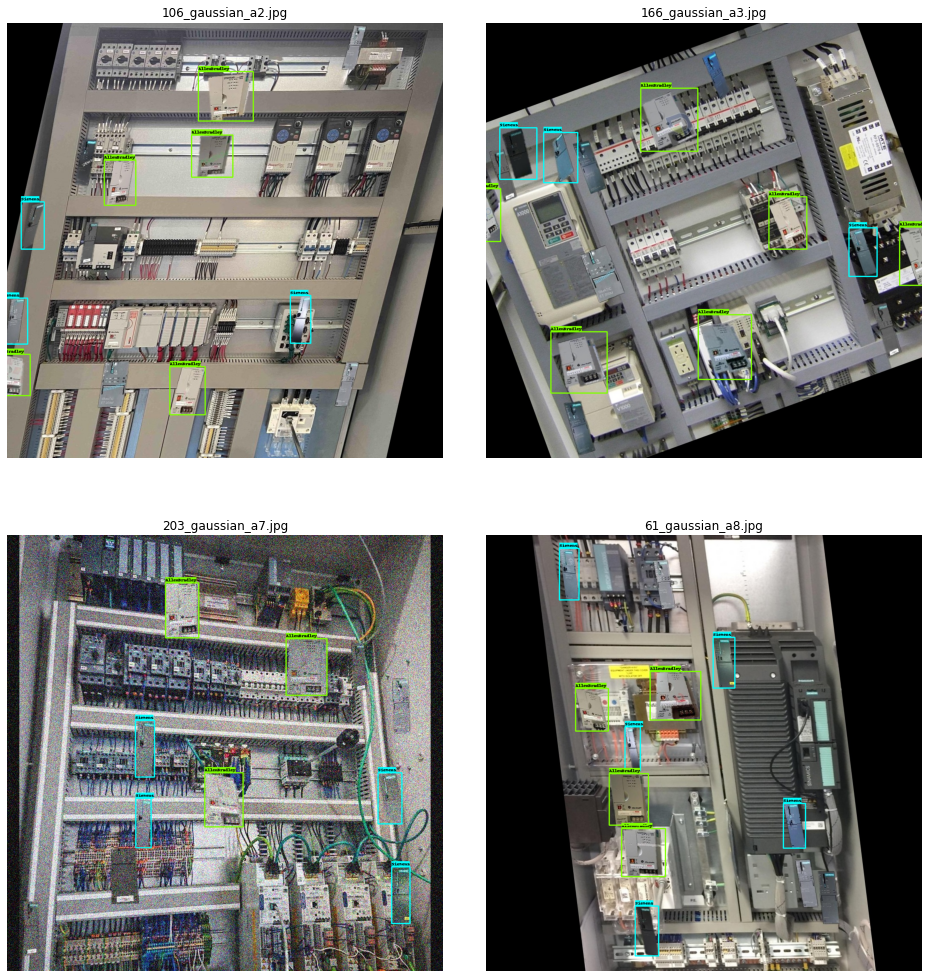

In [ ]:
src_viz.plot_train_images_w_labels(train_data_dir, label_map_path, num_img=4, img_per_row=2, lw=3)    

Plot some validation images

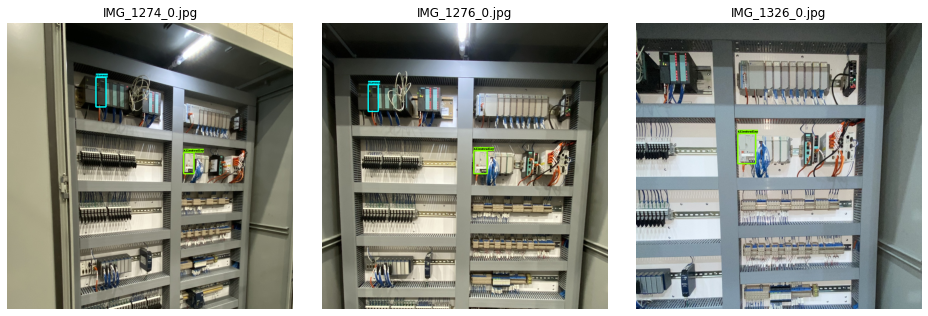

In [ ]:
src_viz.plot_train_images_w_labels(valid_data_dir, label_map_path, num_img=3, img_per_row=3, lw=5)    

## Choose our model

Training an object detection model from scratch is extremely time-consuming. Instead, we resort to transfer learning by taking a pre-trained model and then fine-tuning it on our data.

We find that two fine-tuned models based on the EfficientDet architecture with different levels of augmentation (RandAugment magnitudes `rand_aug_mag`=1.0 and 1.4) produced best results in our experiments:
* `efficient_det_1024_rand_aug_1_4`: 1024x1024 resolution with strong augmentation
* `efficient_det_1024_rand_aug_1_0`: 1024x1024 resolution with light augmentation

The model with strong augmentation provides a significantly better mAP score at 0.75 IoU (~50%, as opposed to ~30% for the model with light augmentation), meaning that it localises the objects better. Both models have the same mAP=78% at 0.5 IoU, which is a more important metric if we care more about identification then precise localisation. The model with light augmentation however sometimes produces 1-2 less Allen Bradley non-detections at oblique angles. The model choice should be based on the available validation/testing data. Here we train the model with strong augmentation. 

All the models should use the same synthesised dataset in `data/synthetic-annotated-train-images/bg_adjusted_with_distractors` for best results.

We trained our models on an 8-core Tensor Processing Unit (a type of GPU made by Google) on Google Colab using the batch size of 32.

Both trained models are already placed in `FT_MODELS_DIR`. Here, for demonstration purposes, we train a new model with the same configuration as `efficient_det_1024_rand_aug_1_4` and call it `efficient_det_1024_rand_aug_1_4_demo`. 

In [20]:
# List of TF pre-trained models with download links (can add more to experiment)
PRE_MODELS = {
    'efficient_det_1024': "http://download.tensorflow.org/models/object_detection/tf2/20200711/efficientdet_d4_coco17_tpu-32.tar.gz",
    'ssd_resnet101_1024': "http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_resnet101_v1_fpn_1024x1024_coco17_tpu-8.tar.gz"
}
# Select a pre-trained model
PRE_MODEL_NAME = 'efficient_det_1024'
# Set the name of our fine-tuned model
MY_MODEL_NAME = 'efficient_det_1024_rand_aug_1_4_demo'

Other models from TF Object Detection Model Zoo can be used as well simply by providing their URL above.

### Make directories and set paths used by the model

In [21]:
# Our model directory
my_model_dir = FT_MODELS_DIR / MY_MODEL_NAME
if not my_model_dir.exists(): my_model_dir.mkdir()

# Make a folder for the exported model
my_export_dir = my_model_dir/'exported'
if not my_export_dir.exists():
  my_export_dir.mkdir()

# Path to the initial fine tune checkpoint (from the pre-trained model)
ft_ckpt_dir = my_model_dir / 'fine_tune_checkpoint'
if not ft_ckpt_dir.exists(): ft_ckpt_dir.mkdir()
ft_ckpt_path = ft_ckpt_dir / 'ckpt-0'

# Path to the model configuration file
config_path = my_model_dir / 'pipeline.config'

## Download a pre-trained model and copy its fine-tune checkpoint

Download a pre-trained model from the TF model zoo and place it in `PRE_MODELS_DIR`.

The EfficientDet D4 (1024x1024) model has already been placed there, but one can experiment with other models as well by changing `PRE_MODEL_NAME`.

In [22]:
zip_path = PRE_MODELS_DIR / (PRE_MODEL_NAME+'.tar.gz')
unzip_dir = PRE_MODELS_DIR / PRE_MODELS[PRE_MODEL_NAME].split('/')[-1].split('.')[0]

urllib.request.urlretrieve(PRE_MODELS[PRE_MODEL_NAME], zip_path)
with tarfile.open(zip_path, "r:gz") as tar:
  tar.extractall(PRE_MODELS_DIR)
os.remove(zip_path)
unzip_dir.rename(PRE_MODELS_DIR / PRE_MODEL_NAME)

As we are doing transfer learning, to start training, we need to copy the checkpoint files from the downloaded pre-trained model to our model folder.

In [23]:
for ckpt_file in glob.glob(str(PRE_MODELS_DIR/PRE_MODEL_NAME/'checkpoint/ckpt-0.*')):
  shutil.copyfile(ckpt_file, ft_ckpt_dir / Path(ckpt_file).name)

## Configure the model

We should also copy the default configuration file for the pre-trained model from its folder to our model folder. However, for our demo model, we will take the same configuration file as the one used to train our best model `efficient_det_1024_rand_aug_1_4` and then describe the changes that have been made to the original default config file.

In [27]:
# copy the config file to our model directory
shutil.copy(FT_MODELS_DIR/"efficient_det_1024_rand_aug_1_4/pipeline.config", 
            config_path)

PosixPath('/content/gdrive/MyDrive/s2ds-aug2021-cv/models/fine-tuned/efficient_det_1024_rand_aug_1_4_demo/pipeline.config')

First, the config file includes paths to the data and model checkpoint that had to be adjusted to our folder structure.

**Paths to the files used by the model**:
* Training data .record file (`train_input_reader.input_path`)
* Evaluation (validation) data .record file (`eval_input_reader.input_path`)
* Fine-tune checkpoint (`fine_tune_checkpoint`)
* Label map file (`train_input_reader.label_map_path`, `eval_input_reader.label_map_path`)

Then, some model parameters had to be modified to achieve better performance for our particular problem.

**Model parameters**:
* **Number of classes** (`num_classes`)<br>
How many types of objects are we detecting. Should be 2 in our case.
* **Learning rate** (`learning_rate_base` in the optimizer section)<br> The training step size at each iteration while moving toward a minimum of the loss function. When set too high, we might fail to reach the minimum, or training may even become unstable. Typically found by grid search. 
* **Batch size** (`train_config.batch_size`)<br> The number of training examples utilized in one iteration. Larger batch size is limited by the available GPU memory. Larger batch size allows us to use larger learning rates, making training quicker. Generally, it is often advised to scale the learning rate as the square root of the batch size for batch sizes < 256, and linearly for >=256.
* **Total number of training steps** (`train_config.num_steps` and `total_steps` in the optimizer section)
* **Anchor boxes**<br>
Object detection models often use a set of predefined shapes for bounding boxes that are further adjusted during training. To facilitate training, we can define a set of bounding box aspect ratios according to our controllers' appearance. Because they are vertically elongated, we choose aspect ratios (0.25, 0.5, 1.) in the `anchor_generator` section. This improves localisation accuracy of our predictions.
* **Additional data augmentation**<br>
On top of our previous augmentations, we introduce random square crops in the range of scales (0.3, 3.0) of the image size. This is controlled by parameters `scale_min` and `scale_max` in the `train_config.data_augmentation_options` section. We have found random cropping extremely effective at improving our predictions in all aspects.

If using TPU, redirect paths to Cloud Storage:

In [25]:
def local2env(path):
    """ 
    Modify paths according to the environment:
    Cloud Storage (when using TPU) or local (no change required)
    """
    if USE_TPU:
      return os.path.join(GS_ROOT, os.path.relpath(path, MAIN_DIR))
    else:
      return path

my_model_dir_env = local2env(my_model_dir)
my_export_dir_env = local2env(my_export_dir)

train_tfrec_path_env = local2env(train_tfrec_path)
valid_tfrec_path_env = local2env(valid_tfrec_path)
label_map_path_env   = local2env(label_map_path)
ft_ckpt_path_env = local2env(ft_ckpt_path)
config_path_env = local2env(config_path)

Because for our model, we are using the same config file as for `efficient_det_1024_rand_aug_1_4`, we only need to modify the paths. When using a batch size other than 32, we can also update its value and scale the learning rate accordingly (however sometimes this is not needed and should be decided upon by experimentation):

In [28]:
# load the config file (or do edits manually)
config = config_util.get_configs_from_pipeline_file(config_path)

# update path to fine-tune checkpoint
config['train_config'].fine_tune_checkpoint = str(ft_ckpt_path_env)
config['train_input_config'].label_map_path = str(label_map_path_env)
config['train_input_config'].tf_record_input_reader.input_path[0] = str(train_tfrec_path_env)
config['eval_input_config'].label_map_path = str(label_map_path_env)
config['eval_input_config'].tf_record_input_reader.input_path[0] = str(valid_tfrec_path_env)

# update batch size
config['train_config'].batch_size = BATCH_SIZE
if BATCH_SIZE<=4:
  # improves training for small batch sizes
  config['model'].ssd.freeze_batchnorm = True

# reduce learning rate for smaller batch sizes
default_lr = config['train_config'].optimizer.momentum_optimizer.learning_rate.cosine_decay_learning_rate.learning_rate_base
default_warmup_lr = config['train_config'].optimizer.momentum_optimizer.learning_rate.cosine_decay_learning_rate.warmup_learning_rate
f = np.sqrt(BATCH_SIZE/32)
config['train_config'].optimizer.momentum_optimizer.learning_rate.cosine_decay_learning_rate.learning_rate_base = f * default_lr
config['train_config'].optimizer.momentum_optimizer.learning_rate.cosine_decay_learning_rate.warmup_learning_rate = f * default_warmup_lr

# save the updated configuration
config_proto = config_util.create_pipeline_proto_from_configs(config)
config_util.save_pipeline_config(config_proto, my_model_dir)

INFO:tensorflow:Writing pipeline config file to /content/gdrive/MyDrive/s2ds-aug2021-cv/models/fine-tuned/efficient_det_1024_rand_aug_1_4_demo/pipeline.config


INFO:tensorflow:Writing pipeline config file to /content/gdrive/MyDrive/s2ds-aug2021-cv/models/fine-tuned/efficient_det_1024_rand_aug_1_4_demo/pipeline.config


**NOTE**: You may also increase the number of training steps when the learning rate is reduced significantly. Both `total_steps` in the optimizer section and `num_steps` in `train_config` need to be changed identically.

Copy the data and model to Cloud Storage (only for TPU)

In [ ]:
"""
The folders models/fine-tuned and data/train-valid-split must have 
already been created in the Cloud Storage bucket.
""" 
if USE_TPU:
  # create an empty file so that GS treats 'export' as a folder
  with open(my_export_dir / 'gs_init', 'w') as f: pass
  # copy the data
  !gsutil -m cp $train_tfrec_path $train_tfrec_path_env
  !gsutil -m cp $valid_tfrec_path $valid_tfrec_path_env
  !gsutil -m cp $label_map_path $label_map_path_env
  # copy the model
  ft_models_dir_gs = os.path.join(GS_ROOT, 'models/fine-tuned')
  !gsutil -m cp -r $my_model_dir $ft_models_dir_gs

## Train the model

Finally, we are ready to train our model.

During training, we need to track model performance on the validation set, because at some point, even though the training metrics will still be improving, the validation metrics will stop doing so or even start to deteriorate. At this point, the model starts to overfit, and training needs to be finished. After training, we can restore the model to the point where the best validation performance was achieved by using the checkpoints saved by the training script.

To validate during training, another `model_main_tf2.py`  process with an option `--checkpoint_dir=$my_model_dir_env` (and  `--checkpoint_every_n` removed) needs to be launched in parallel with the main training process. This process monitors checkpoints saved during training, and calculates validation metrics. Because it isn't possible to accomplish this in a single notebook, you can either run it in a separate notebook called `EPRI_ObjectDetection_Training_Validation.ipynb` or do so in a terminal (*from the notebook folder*) right after starting training:

`python {TF_DIR}/research/object_detection/model_main_tf2.py \`<br>
`--model_dir={my_model_dir_env} \`<br>
`--pipeline_config_path={my_model_dir_env}/pipeline.config \`<br>
`--checkpoint_dir={my_model_dir_env}` 

#### (OPTIONAL) Launch Tensorboard

Tensorboard can interactively visualize training/validation progress (loss functions, validation metrics etc.), as well as plot images with detections obtained during validation. We can either initialize it before training to observe the progress interactively, or launch it when training is finished. 


In [ ]:
#%load_ext tensorboard

In [ ]:
#%tensorboard --logdir=$my_model_dir_env

#### Start training (launch validation right after)

In [36]:
%cd {TF_DIR/'research/object_detection'}
!python model_main_tf2.py \
--model_dir=$my_model_dir_env \
--pipeline_config_path=$config_path_env \
--checkpoint_every_n=500 \
--use_tpu=$USE_TPU 
%cd {NOTEBOOK_DIR}

/content/gdrive/MyDrive/s2ds-aug2021-cv/tf-models/research/object_detection
2021-09-20 22:19:31.903818: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2021-09-20 22:19:31.903883: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (c1cd6febba8b): /proc/driver/nvidia/version does not exist
2021-09-20 22:19:31.910930: I tensorflow/core/distributed_runtime/rpc/grpc_channel.cc:272] Initialize GrpcChannelCache for job worker -> {0 -> 10.8.8.122:8470}
2021-09-20 22:19:31.911007: I tensorflow/core/distributed_runtime/rpc/grpc_channel.cc:272] Initialize GrpcChannelCache for job localhost -> {0 -> localhost:34513}
2021-09-20 22:19:31.927287: I tensorflow/core/distributed_runtime/rpc/grpc_channel.cc:272] Initialize GrpcChannelCache for job worker -> {0 -> 10.8.8.122:8470}
2021-09-20 22:19:31.927355: I tensorflow/core/distributed_runtime/rpc/grpc_c

**NOTE**: We have optimized performance for BATCH_SIZE=32, and training at very small batch sizes (e.g. on a single GPU) can be slow and requires more careful tuning of the learning rate to ensure stability.

## See results on Tensorboard

Here, for demonstration purposes, we show results for our best model already saved in `models/fine-tuned`. You can add '_demo' to the model path to see results from the freshly trained demo model. If you go to the IMAGES section, you can see predictions made by the validation process for each checkpoint. Click on an image to zoom it in.

There should be 6000 training steps shown on Tensorboard. Sometimes Tensorboard randomly shows less steps for no reason. In this case, simply restart the cell.

In [ ]:
%load_ext tensorboard

In [17]:
%tensorboard --logdir={FT_MODELS_DIR/'efficient_det_1024_rand_aug_1_4'}

Reusing TensorBoard on port 6006 (pid 410), started 0:05:38 ago. (Use '!kill 410' to kill it.)

<IPython.core.display.Javascript object>

## Export the model

After analyzing how the validation metrics behave over time during training, we can choose the optimal checkpoint to save our model at.

This is done by opening {my_model_dir_env}/checkpoint file and modifying `model_checkpoint_path`.

In [ ]:
# if using TPU with Cloud Storage, download the checkpoint file 
if USE_TPU:
  ckpt_path = os.path.join(my_model_dir_env, 'checkpoint')
  !gsutil cp $ckpt_path ./

In [ ]:
# modify locally and upload back to Cloud Storage
if USE_TPU:
  !gsutil cp checkpoint $my_model_dir_env

After the best checkpoint has been selected, we can export the model:

In [40]:
%cd {TF_DIR/'research/object_detection'}
!python exporter_main_v2.py \
--input_type image_tensor \
--pipeline_config_path $config_path_env \
--trained_checkpoint_dir $my_model_dir_env \
--output_directory $my_export_dir_env
%cd {NOTEBOOK_DIR}

/content/gdrive/MyDrive/s2ds-aug2021-cv/tf-models/research/object_detection
2021-09-21 00:25:21.288068: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2021-09-21 00:25:21.288139: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (c1cd6febba8b): /proc/driver/nvidia/version does not exist
I0921 00:25:22.696720 140590160480128 ssd_efficientnet_bifpn_feature_extractor.py:143] EfficientDet EfficientNet backbone version: efficientnet-b4
I0921 00:25:22.697017 140590160480128 ssd_efficientnet_bifpn_feature_extractor.py:144] EfficientDet BiFPN num filters: 224
I0921 00:25:22.697108 140590160480128 ssd_efficientnet_bifpn_feature_extractor.py:146] EfficientDet BiFPN num iterations: 7
I0921 00:25:22.701650 140590160480128 efficientnet_model.py:147] round_filter input=32 output=48
I0921 00:25:22.755856 140590160480128 efficientnet_model.py:147] rou

Copy the exported model from Cloud Storage

In [ ]:
if USE_TPU:
  !gsutil -m cp -r $my_export_dir_env $my_model_dir